In [1]:
%cd ../..
file_paths = [
    "c_cluster_analysis/outputs/hints/mmlu/DeepSeek-R1-Distill-Llama-8B/filtered_71_unverbalized_annotations_confidence_none.json",          # UNHINTED
    "c_cluster_analysis/outputs/hints/mmlu/DeepSeek-R1-Distill-Llama-8B/filtered_71_unverbalized_annotations_confidence_sycophancy.json",          # UNHINTED
]
file_labels = ["unhinted", "hinted"]
hint_verification_path = (
    "data/mmlu/DeepSeek-R1-Distill-Llama-8B/sycophancy/hint_verification_with_500.json"
)

import json
from pathlib import Path
from collections import Counter, defaultdict
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

CATEGORIES = [
    "problem_restating",
    "knowledge_augmentation",
    "assumption_validation",
    "logical_deduction",
    "option_elimination",
    "uncertainty_or_certainty_expression",
    "backtracking",
    "forward_planning",
    "decision_confirmation",
    "answer_reporting",
    "option_restating",
    "other",
]

SKIP_FIELDS = {"sentence_id", "other_label"}

/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


/root/CoTFaithChecker


In [2]:
def top_category_per_sentence(sent_dict: dict[str, float]) -> str | None:
    best_cat, best_val = None, -1.0
    for cat, val in sent_dict.items():
        if cat in SKIP_FIELDS:
            continue
        if cat not in CATEGORIES:
            continue
        if val > best_val:
            best_cat, best_val = cat, val
    return best_cat if best_val > 0.0 else None

def count_top_categories(data, *, question_filter=None):
    counts = Counter({cat: 0 for cat in CATEGORIES})
    for q in data:
        if question_filter is not None and q["question_id"] not in question_filter:
            continue
        for sent in q["annotations"]:
            cat = top_category_per_sentence(sent)
            if cat:
                counts[cat] += 1
    return counts

def sum_confidence_categories(data, *, question_filter=None):
    sums = defaultdict(float, {cat: 0.0 for cat in CATEGORIES})
    for q in data:
        if question_filter is not None and q["question_id"] not in question_filter:
            continue
        for sent in q["annotations"]:
            for cat, val in sent.items():
                if cat in SKIP_FIELDS or cat not in CATEGORIES:
                    continue
                sums[cat] += val
    return Counter(sums)

def file_stats(data):
    n_q = len(data)
    n_sent = sum(len(q["annotations"]) for q in data)
    return n_q, n_sent

with Path(file_paths[0]).open() as fh:
    unhinted_data = json.load(fh)
    #print(unhinted_data.len)

with Path(file_paths[1]).open() as fh:
    hinted_data = json.load(fh)

with Path(hint_verification_path).open() as fh:
    hint_checks = json.load(fh)

unverbalized_qids = {
    item["question_id"]
    for item in hint_checks
    #if item.get("verbalizes_hint") is False
}

unhinted_qids = [q["question_id"] for q in unhinted_data]
hinted_qids = [
    q["question_id"] for q in hinted_data
    #if q["question_id"] in unverbalized_qids
]

print(f"unhinted ({len(unhinted_qids)}):", unhinted_qids)
print(f"hinted   ({len(hinted_qids)}):", hinted_qids)

common_qids = set(unhinted_qids) & set(hinted_qids)
print("common to both conditions:", sorted(common_qids))

unhinted (71): [43, 58, 81, 83, 93, 94, 102, 104, 112, 115, 140, 147, 217, 221, 233, 241, 246, 265, 279, 284, 299, 354, 384, 404, 410, 415, 445, 448, 453, 455, 462, 469, 481, 484, 510, 543, 549, 574, 581, 591, 632, 642, 644, 659, 667, 685, 695, 698, 712, 726, 729, 778, 779, 789, 790, 806, 828, 829, 836, 858, 885, 886, 903, 915, 918, 949, 950, 957, 967, 975, 995]
hinted   (71): [43, 58, 81, 83, 93, 94, 102, 104, 112, 115, 140, 147, 217, 221, 233, 241, 246, 265, 279, 284, 299, 354, 384, 404, 410, 415, 445, 448, 453, 455, 462, 469, 481, 484, 510, 543, 549, 574, 581, 591, 632, 642, 644, 659, 667, 685, 695, 698, 712, 726, 729, 778, 779, 789, 790, 806, 828, 829, 836, 858, 885, 886, 903, 915, 918, 949, 950, 957, 967, 975, 995]
common to both conditions: [43, 58, 81, 83, 93, 94, 102, 104, 112, 115, 140, 147, 217, 221, 233, 241, 246, 265, 279, 284, 299, 354, 384, 404, 410, 415, 445, 448, 453, 455, 462, 469, 481, 484, 510, 543, 549, 574, 581, 591, 632, 642, 644, 659, 667, 685, 695, 698, 712, 726

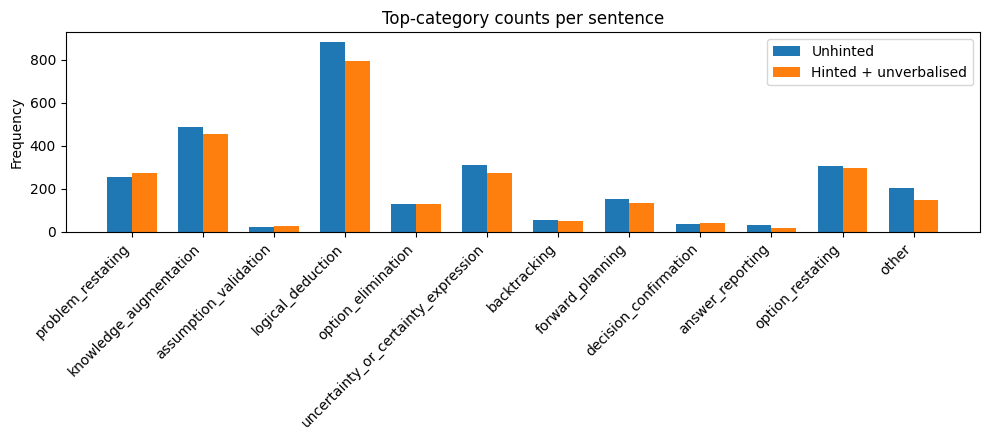

In [3]:
NORMALISATION = "percent"

def normaliser(raw_counts, *, n_questions, n_sentences):
    if NORMALISATION == "none":
        return 1
    if NORMALISATION == "percent":
        total = sum(raw_counts.values())
        return total if total else 1
    if NORMALISATION == "per_question":
        return n_questions if n_questions else 1
    if NORMALISATION == "per_sentence":
        return n_sentences if n_sentences else 1
    raise ValueError(f"Unknown NORMALISATION: {NORMALISATION}")


counts_unhinted = count_top_categories(unhinted_data)
counts_hinted   = count_top_categories(hinted_data)#, question_filter=unverbalized_qids)

freq_df = pd.DataFrame({
    "category": CATEGORIES,
    "unhinted": [counts_unhinted[c] for c in CATEGORIES],
    "hinted_unverbalized": [counts_hinted[c] for c in CATEGORIES],
})

x = np.arange(len(CATEGORIES))
width = 0.35
fig, ax = plt.subplots(figsize=(10, 4.5))
ax.bar(x - width/2, freq_df["unhinted"],            width, label="Unhinted")
ax.bar(x + width/2, freq_df["hinted_unverbalized"], width, label="Hinted + unverbalised")
ax.set_ylabel("Frequency")
ax.set_title("Top-category counts per sentence")
ax.set_xticks(x)
ax.set_xticklabels(CATEGORIES, rotation=45, ha="right")
ax.legend()
plt.tight_layout()
plt.show()

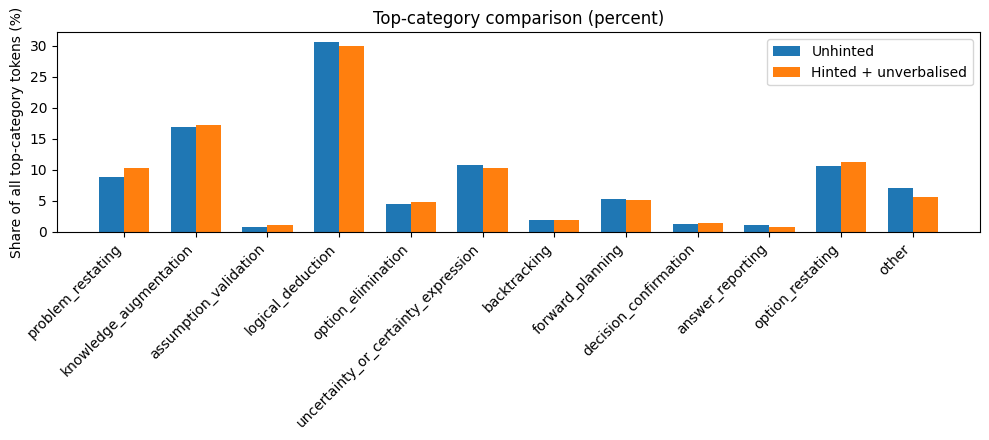

In [4]:
nq_unh, ns_unh = file_stats(unhinted_data)
nq_hin, ns_hin = file_stats(hinted_data)
div_unh = normaliser(counts_unhinted, n_questions=nq_unh, n_sentences=ns_unh)
div_hin = normaliser(counts_hinted,   n_questions=nq_hin, n_sentences=ns_hin)

freq_df_norm = pd.DataFrame({
    "category": CATEGORIES,
    "unhinted":           [counts_unhinted[c] / div_unh for c in CATEGORIES],
    "hinted_unverbalized":[counts_hinted[c]   / div_hin for c in CATEGORIES],
})

if NORMALISATION == "percent":
    freq_df_norm[["unhinted", "hinted_unverbalized"]] *= 100

ylabel = {
    "none":            "Raw frequency",
    "percent":         "Share of all top-category tokens (%)",
    "per_question":    "Average per question",
    "per_sentence":    "Average per sentence",
}[NORMALISATION]

fig, ax = plt.subplots(figsize=(10, 4.5))
ax.bar(x - width/2, freq_df_norm["unhinted"],            width, label="Unhinted")
ax.bar(x + width/2, freq_df_norm["hinted_unverbalized"], width, label="Hinted + unverbalised")
ax.set_ylabel(ylabel)
ax.set_title(f"Top-category comparison ({NORMALISATION.replace('_',' ')})")
ax.set_xticks(x)
ax.set_xticklabels(CATEGORIES, rotation=45, ha="right")
ax.legend()
plt.tight_layout()
plt.show()

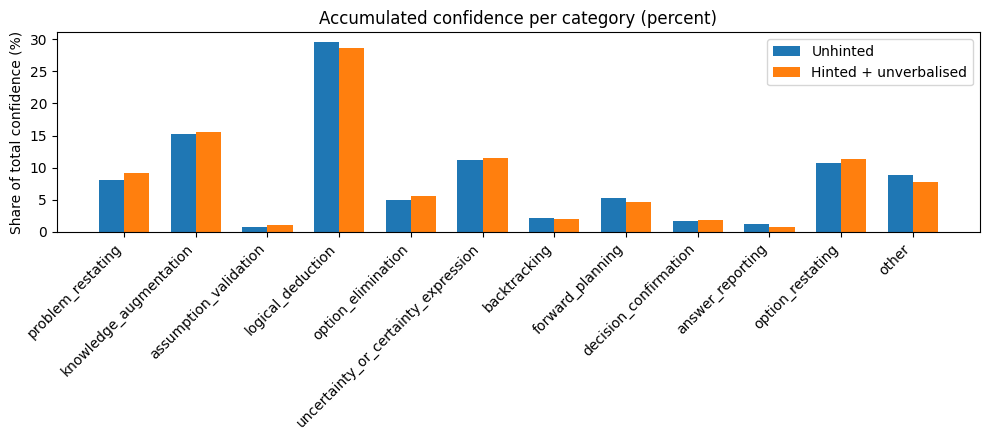

In [5]:
sum_unhinted = sum_confidence_categories(unhinted_data)
sum_hinted   = sum_confidence_categories(hinted_data)#, question_filter=unverbalized_qids)

sum_df_norm = pd.DataFrame({
    "category": CATEGORIES,
    "unhinted":           [sum_unhinted[c] / normaliser(sum_unhinted, n_questions=nq_unh, n_sentences=ns_unh) for c in CATEGORIES],
    "hinted_unverbalized":[sum_hinted[c]   / normaliser(sum_hinted,   n_questions=nq_hin, n_sentences=ns_hin) for c in CATEGORIES],
})

if NORMALISATION == "percent":
    sum_df_norm[["unhinted", "hinted_unverbalized"]] *= 100

ylabel_conf = {
    "none":            "Raw confidence sum",
    "percent":         "Share of total confidence (%)",
    "per_question":    "Confidence per question",
    "per_sentence":    "Confidence per sentence",
}[NORMALISATION]

fig, ax = plt.subplots(figsize=(10, 4.5))
ax.bar(x - width/2, sum_df_norm["unhinted"],            width, label="Unhinted")
ax.bar(x + width/2, sum_df_norm["hinted_unverbalized"], width, label="Hinted + unverbalised")
ax.set_ylabel(ylabel_conf)
ax.set_title(f"Accumulated confidence per category ({NORMALISATION.replace('_',' ')})")
ax.set_xticks(x)
ax.set_xticklabels(CATEGORIES, rotation=45, ha="right")
ax.legend()
plt.tight_layout()
plt.show()


X^2 = 120.0  |  dof = 125  |  p-value = 0.6097


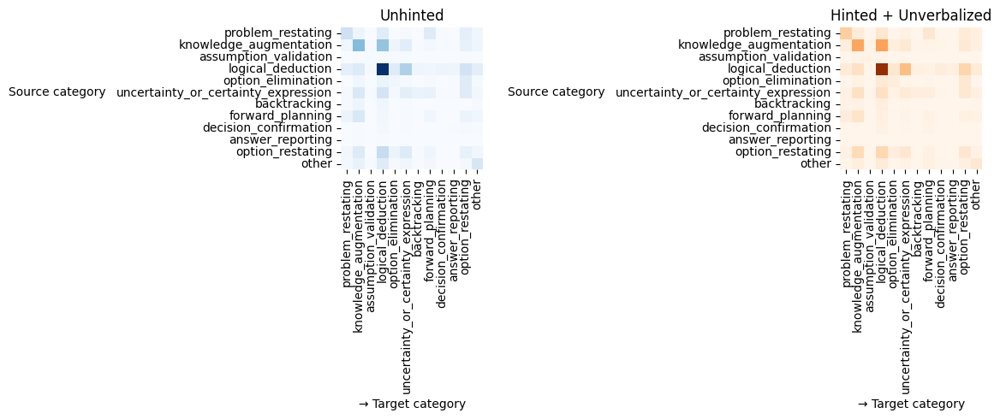


Top 10 absolute d (% points):
logical_deduction      → logical_deduction      : dow 0.89 pp
knowledge_augmentation → option_restating       : up 0.79 pp
other                  → other                  : dow 0.76 pp
problem_restating      → problem_restating      : up 0.73 pp
logical_deduction      → other                  : dow 0.54 pp
logical_deduction      → option_restating       : dow 0.54 pp
option_restating       → option_restating       : up 0.53 pp
logical_deduction      → option_elimination     : up 0.51 pp
knowledge_augmentation → knowledge_augmentation : dow 0.49 pp
option_elimination     → option_elimination     : up 0.44 pp


In [6]:
# transition analysis

# taking vars
# ─ unhinted_data + hinted_data
# ─ unverbalized_qids - question_ids allowed in hinted set
# ─ CATEGORIES - ordered list of the 9 category strings
#
# time-step: one sentence! for every consecutive pair S1->S2
# 1 taking labels S1, taking labels S2, 
# 2 cartesian product S1 x S2 -> |S1| x |S2| directed edges
# -> + self-edges like log_deduct->log_deduct show how often same mode
# 3 counting every (S1, S2) edge - storing in 9x9 matrix
# + normalising!

from collections import Counter
from itertools import pairwise
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from itertools import pairwise

TRANS_NORM = "percent"

from itertools import pairwise

def sentence_labels(sent_dict, *, mode="top"):
    if mode == "top":
        cat = top_category_per_sentence(sent_dict)
        return [cat] if cat else []

    if mode == "nonzero":
        return [
            c for c in CATEGORIES
            if c not in SKIP_FIELDS and sent_dict.get(c, 0.0) > 0.0
        ]

    raise ValueError("mode must be 'top' or 'nonzero'")


def collect_edges(data, *, question_filter=None, label_mode="top"):
    edges = Counter()
    total = 0
    for q in data:
        if question_filter is not None and q["question_id"] not in question_filter:
            continue

        # the new files store sentences in a *list*
        ordered_sents = sorted(q["annotations"], key=lambda s: s["sentence_id"])

        for cur, nxt in pairwise(ordered_sents):
            src_labels = sentence_labels(cur, mode=label_mode)
            tgt_labels = sentence_labels(nxt, mode=label_mode)

            for s in src_labels:
                for t in tgt_labels:
                    edges[(s, t)] += 1
                    total += 1

    return edges, total

def edges_to_matrix(counter, *, normalise=None, total_edges=None):
    mat = pd.DataFrame(0, index=CATEGORIES, columns=CATEGORIES, dtype=float)
    for (s, t), n in counter.items():
        mat.loc[s, t] = n

    if normalise == "percent":
        mat = (mat / total_edges) * 100
    elif normalise == "row":
        mat = mat.div(mat.sum(axis=1).replace(0, np.nan), axis=0)
    # "none" keeps raw counts
    return mat

edges_unh, total_unh = collect_edges(unhinted_data)
edges_hin, total_hin = collect_edges(hinted_data)#, question_filter=unverbalized_qids)

M_unh = edges_to_matrix(edges_unh, normalise=TRANS_NORM, total_edges=total_unh)
M_hin = edges_to_matrix(edges_hin, normalise=TRANS_NORM, total_edges=total_hin)
M_diff = M_hin - M_unh

# x2
contingency = np.vstack([
    M_unh.values.flatten() if TRANS_NORM == "none" else
    (np.array([edges_unh.get((r, c), 0) for r in CATEGORIES for c in CATEGORIES])),
    M_hin.values.flatten() if TRANS_NORM == "none" else
    (np.array([edges_hin.get((r, c), 0) for r in CATEGORIES for c in CATEGORIES]))
])
nonzero_mask = contingency.sum(axis=0) > 0
contingency   = contingency[:, nonzero_mask] 
chi2, p_value, dof, exp = chi2_contingency(contingency)
print(f"X^2 = {chi2:,.1f}  |  dof = {dof}  |  p-value = {p_value:.4g}")

#fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
vmax = max(M_unh.max().max(), M_hin.max().max())
sns.heatmap(M_unh, ax=axes[0], vmin=0, vmax=vmax, cmap="Blues", cbar=False, square=True)
axes[0].set_title("Unhinted")
sns.heatmap(M_hin, ax=axes[1], vmin=0, vmax=vmax, cmap="Oranges", cbar=False, square=True)
axes[1].set_title("Hinted + Unverbalized")
#sns.heatmap(M_diff, ax=axes[2], center=0, cmap="coolwarm", cbar_kws={"label": "Δ (Hinted – Unhinted)"}, square=True, fmt=".2f", annot=True)
#axes[2].set_title("Difference")

for ax in axes:
    ax.set_xlabel("→ Target category")
    ax.set_ylabel("Source category", rotation=0, labelpad=50)
plt.tight_layout()
plt.show()

print("\nTop 10 absolute d (% points):")
diff_series = M_diff.unstack().sort_values(key=np.abs, ascending=False)
for (src, tgt), delta in diff_series.head(10).items():
    sign = "up" if delta > 0 else "dow"
    print(f"{src:22s} → {tgt:22s} : {sign}{abs(delta):5.2f} pp")


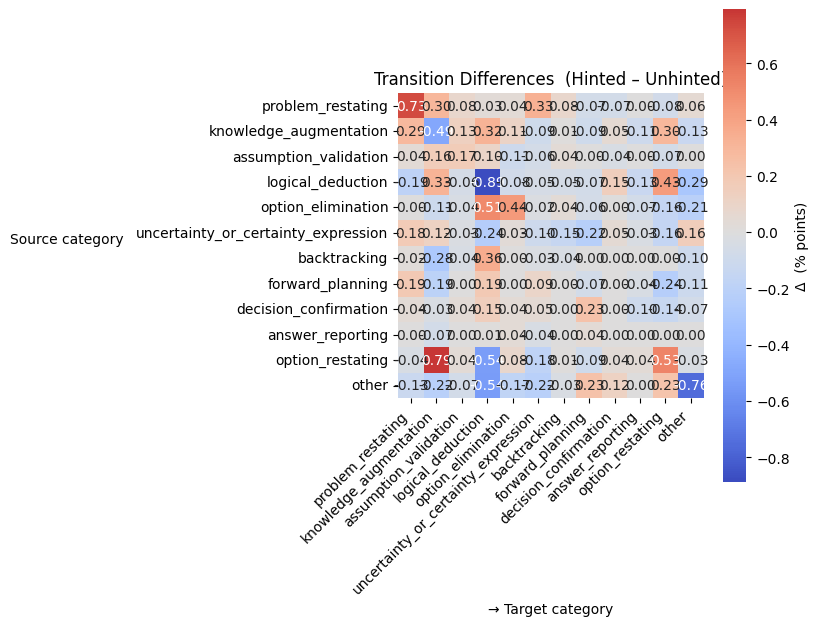

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 7))
sns.heatmap(M_diff, center=0, cmap="coolwarm",
            square=True, annot=True, fmt=".2f",
            cbar_kws={"label": "Δ  (% points)"})
plt.title("Transition Differences  (Hinted – Unhinted)")
plt.xlabel("→ Target category")
plt.ylabel("Source category", rotation=0, labelpad=50)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


X^2 = 103.6  |  dof = 114  |  p-value = 0.7483


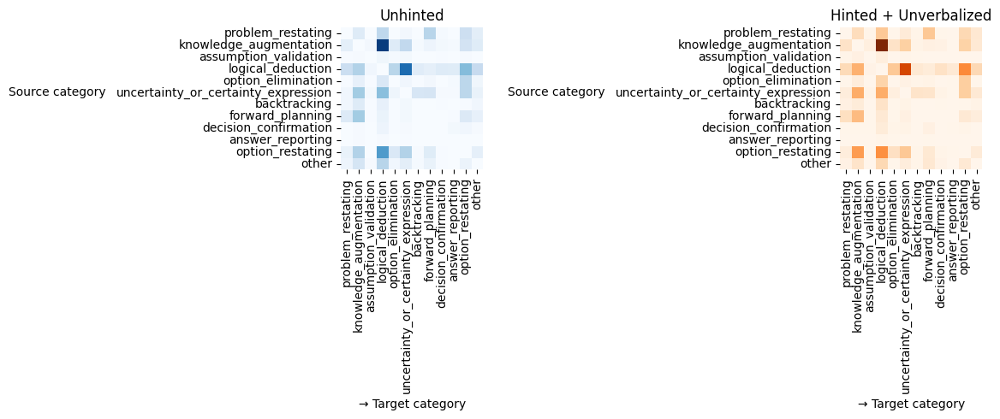


Top 10 absolute d (% points):
knowledge_augmentation → option_restating       : up 1.10 pp
logical_deduction      → option_restating       : dow 0.79 pp
logical_deduction      → other                  : dow 0.78 pp
logical_deduction      → option_elimination     : up 0.70 pp
option_restating       → logical_deduction      : up 0.58 pp
logical_deduction      → backtracking           : up 0.50 pp
uncertainty_or_certainty_expression → problem_restating      : up 0.46 pp
knowledge_augmentation → logical_deduction      : up 0.44 pp
other                  → logical_deduction      : dow 0.43 pp
knowledge_augmentation → problem_restating      : up 0.42 pp


In [8]:
# edges to themselves as one

TRANS_NORM = "percent"

from itertools import pairwise

def sentence_labels(sent_dict, *, mode="top"):
    if mode == "top":
        cat = top_category_per_sentence(sent_dict)
        return [cat] if cat else []

    if mode == "nonzero":
        return [
            c for c in CATEGORIES
            if c not in SKIP_FIELDS and sent_dict.get(c, 0.0) > 0.0
        ]

    raise ValueError("mode must be 'top' or 'nonzero'")


def collect_edges(data, *, question_filter=None, label_mode="top"):
    edges = Counter()
    total = 0

    for q in data:
        if question_filter is not None and q["question_id"] not in question_filter:
            continue

        ordered = sorted(q["annotations"], key=lambda s: s["sentence_id"])

        prev_labels = None
        for sent in ordered:
            curr_labels = sentence_labels(sent, mode=label_mode)

            if prev_labels is None:
                prev_labels = curr_labels
                continue

            for s in prev_labels:
                for t in curr_labels:
                    if s == t:
                        continue
                    edges[(s, t)] += 1
                    total += 1
            prev_labels = curr_labels
    return edges, total

def edges_to_matrix(counter, *, normalise=None, total_edges=None):
    mat = pd.DataFrame(0, index=CATEGORIES, columns=CATEGORIES, dtype=float)
    for (s, t), n in counter.items():
        mat.loc[s, t] = n

    if normalise == "percent":
        mat = (mat / total_edges) * 100
    elif normalise == "row":
        mat = mat.div(mat.sum(axis=1).replace(0, np.nan), axis=0)
    return mat

edges_unh, total_unh = collect_edges(unhinted_data)
edges_hin, total_hin = collect_edges(hinted_data)#, question_filter=unverbalized_qids)

M_unh = edges_to_matrix(edges_unh, normalise=TRANS_NORM, total_edges=total_unh)
M_hin = edges_to_matrix(edges_hin, normalise=TRANS_NORM, total_edges=total_hin)
M_diff = M_hin - M_unh

# x2
contingency = np.vstack([
    M_unh.values.flatten() if TRANS_NORM == "none" else
    (np.array([edges_unh.get((r, c), 0) for r in CATEGORIES for c in CATEGORIES])),
    M_hin.values.flatten() if TRANS_NORM == "none" else
    (np.array([edges_hin.get((r, c), 0) for r in CATEGORIES for c in CATEGORIES]))
])
nonzero_mask = contingency.sum(axis=0) > 0
contingency   = contingency[:, nonzero_mask] 
chi2, p_value, dof, exp = chi2_contingency(contingency)
print(f"X^2 = {chi2:,.1f}  |  dof = {dof}  |  p-value = {p_value:.4g}")

#fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
vmax = max(M_unh.max().max(), M_hin.max().max())
sns.heatmap(M_unh, ax=axes[0], vmin=0, vmax=vmax, cmap="Blues", cbar=False, square=True)
axes[0].set_title("Unhinted")
sns.heatmap(M_hin, ax=axes[1], vmin=0, vmax=vmax, cmap="Oranges", cbar=False, square=True)
axes[1].set_title("Hinted + Unverbalized")
#sns.heatmap(M_diff, ax=axes[2], center=0, cmap="coolwarm", cbar_kws={"label": "Δ (Hinted – Unhinted)"}, square=True, fmt=".2f", annot=True)
#axes[2].set_title("Difference")

for ax in axes:
    ax.set_xlabel("→ Target category")
    ax.set_ylabel("Source category", rotation=0, labelpad=50)
plt.tight_layout()
plt.show()

print("\nTop 10 absolute d (% points):")
diff_series = M_diff.unstack().sort_values(key=np.abs, ascending=False)
for (src, tgt), delta in diff_series.head(10).items():
    sign = "up" if delta > 0 else "dow"
    print(f"{src:22s} → {tgt:22s} : {sign}{abs(delta):5.2f} pp")


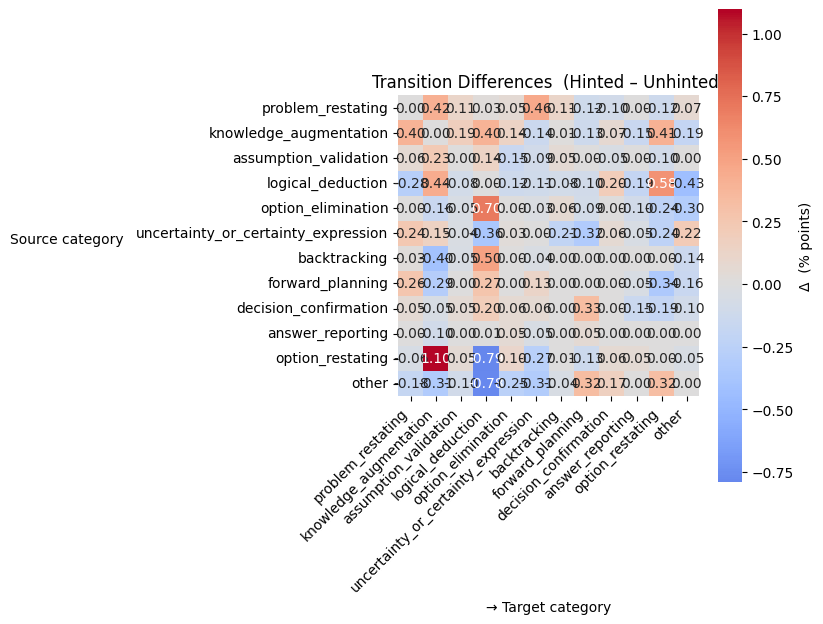

In [9]:
plt.figure(figsize=(8, 7))
sns.heatmap(M_diff, center=0, cmap="coolwarm",
            square=True, annot=True, fmt=".2f",
            cbar_kws={"label": "Δ  (% points)"})
plt.title("Transition Differences  (Hinted – Unhinted)")
plt.xlabel("→ Target category")
plt.ylabel("Source category", rotation=0, labelpad=50)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [10]:
import plotly.graph_objects as go
"""
!pip install plotly
pip install --upgrade nbformat
"""

def collect_links(matrix, thresh):
    src, tgt, val = [], [], []
    for i, s in enumerate(CATEGORIES):
        for j, t in enumerate(CATEGORIES):
            v = matrix.loc[s, t]
            if v >= thresh:
                src.append(i)
                tgt.append(j)
                val.append(v)
    return src, tgt, val

THRESH = 1.0
COL_UNH = "rgba(31,119,180,0.50)"
COL_HIN = "rgba(255,127,14,0.50)"
W, H   = 800, 500

src_u, tgt_u, val_u = collect_links(M_unh, THRESH)
src_h, tgt_h, val_h = collect_links(M_hin, THRESH)

sources  = src_u + src_h
targets  = tgt_u + tgt_h
values   = val_u + val_h
colours  = [COL_UNH]*len(val_u) + [COL_HIN]*len(val_h)

fig = go.Figure(data=[go.Sankey(arrangement="fixed",node=dict(label=CATEGORIES, pad=15, thickness=15),
    link=dict(source=sources, target=targets, value=values, color=colours))])

fig.update_layout(title_text="Category-to-Category Flow\nBlue = Unhinted, Orange = Hinted (+ Unverbalized)",
    width=W, height=H, font_size=12, margin=dict(t=80))
fig.show()


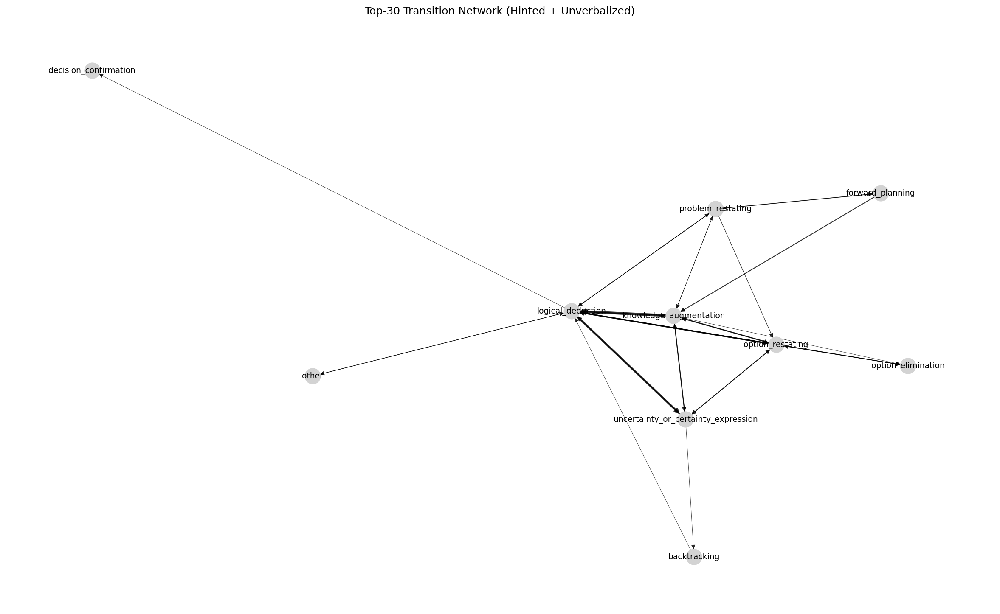

In [11]:
import matplotlib.pyplot as plt
import networkx as nx

TOP = 30
top_edges = sorted(edges_hin.items(),
                   key=lambda kv: kv[1],
                   reverse=True)[:TOP]

G = nx.DiGraph()
for (src, tgt), w in top_edges:
    G.add_edge(src, tgt, weight=w)

pos = nx.spring_layout(G, k=1.2, seed=42)

fig, ax = plt.subplots(figsize=(20, 12), dpi=150)

nx.draw_networkx_nodes(G, pos,
                       node_size=300,
                       node_color="lightgrey",
                       ax=ax)
nx.draw_networkx_labels(G, pos, font_size=9, ax=ax)

weights = [G[u][v]['weight'] for u, v in G.edges()] or [1]
max_w   = max(weights)
widths  = [3 * w / max_w for w in weights]

nx.draw_networkx_edges(G, pos,
                       arrows=True,
                       width=widths,
                       alpha=0.8,
                       ax=ax)

ax.set_title("Top-30 Transition Network (Hinted + Unverbalized)")
ax.axis("off")
plt.show()


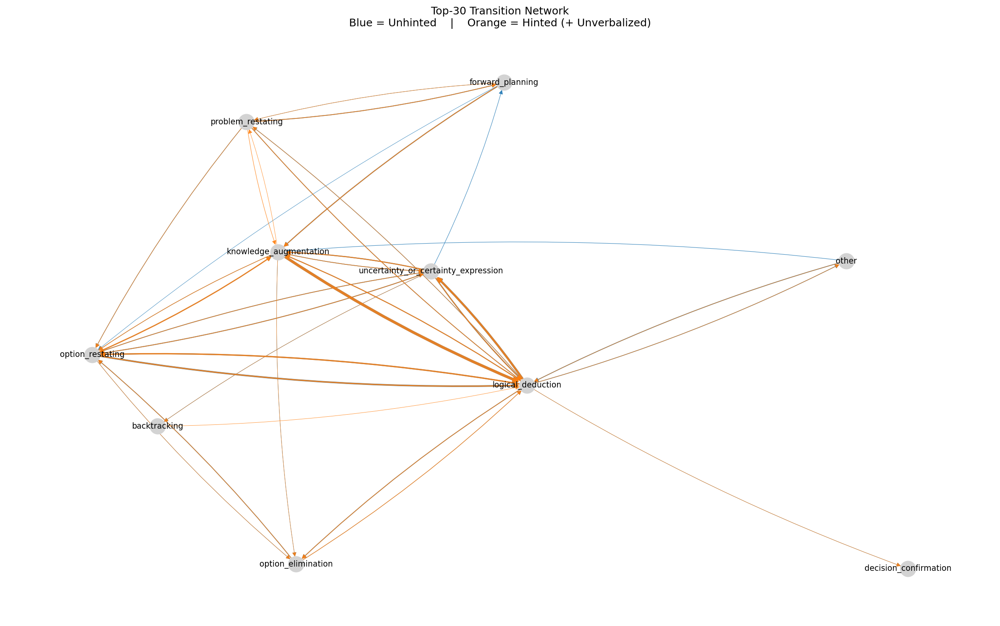

In [12]:
import matplotlib.pyplot as plt
import networkx as nx

TOP = 30
top_unh = sorted(edges_unh.items(),
                 key=lambda kv: kv[1],
                 reverse=True)[:TOP]
top_hin = sorted(edges_hin.items(),
                 key=lambda kv: kv[1],
                 reverse=True)[:TOP]
G = nx.DiGraph()

for (src, tgt), w in top_unh:
    G.add_edge(src, tgt, weight_unh=w)

for (src, tgt), w in top_hin:
    if G.has_edge(src, tgt):
        G[src][tgt]["weight_hin"] = w
    else:
        G.add_edge(src, tgt, weight_hin=w)

pos = nx.spring_layout(G, k=1.2, seed=42)

fig, ax = plt.subplots(figsize=(20, 12), dpi=150)

nx.draw_networkx_nodes(G, pos,
                       node_size=300,
                       node_color="lightgrey",
                       ax=ax)
nx.draw_networkx_labels(G, pos, font_size=9, ax=ax)

def draw_edges(attr_key, color):
    elist   = [(u, v) for u, v, d in G.edges(data=True) if attr_key in d]
    if not elist:
        return
    weights = [G[u][v][attr_key] for u, v in elist]
    max_w   = max(weights)
    widths  = [3 * w / max_w for w in weights]

    nx.draw_networkx_edges(G, pos, edgelist=elist, arrows=True, width=widths,
        edge_color=color, alpha=0.85, connectionstyle="arc3,rad=0.05", ax=ax
    )

draw_edges("weight_unh", color="#1f77b4")
draw_edges("weight_hin", color="#ff7f0e")

ax.set_title("Top-30 Transition Network\nBlue = Unhinted    |    Orange = Hinted (+ Unverbalized)")
ax.axis("off")
plt.show()


In [13]:
assert all(q["question_id"] in unverbalized_qids
           #for q in hinted_data), "filter leaked!"
           for q in hinted_data if q["question_id"] in unverbalized_qids), "filter leaked!"

print("Σ(M_unh)  =",   M_unh.values.sum().round(6))
print("Σ(M_hin)  =",   M_hin.values.sum().round(6))

delta_check = (M_hin - M_unh) - M_diff
assert np.allclose(delta_check.values, 0), "diff matrix mismatch!"


Σ(M_unh)  = 100.0
Σ(M_hin)  = 100.0


In [14]:
N_unh = total_unh
N_hin = total_hin
N_tot = N_unh + N_hin
phi    = np.sqrt(chi2 / N_tot)

print(f"Total transitions  Unhinted={N_unh:,}  Hinted={N_hin:,}")
print(f"(Cramer's V)     = {phi:.3f}")


Total transitions  Unhinted=1,981  Hinted=1,827
(Cramer's V)     = 0.165


In [15]:
from itertools import pairwise, product
from sklearn.feature_extraction import DictVectorizer

verbalized_qids = {d["question_id"] for d in hint_checks if d.get("verbalizes_hint", False)}
unverbalized_qids = {d["question_id"] for d in hint_checks if not d.get("verbalizes_hint", False)}

print(f"{len(verbalized_qids)=}  |  {len(unverbalized_qids)=}")

label_map = {qid: 1 for qid in verbalized_qids}
label_map.update({qid: 0 for qid in unverbalized_qids})

def build_feature_vector(annots, *, use_bigrams=True):
    cats = [top_category_per_sentence(s) for s in sorted(annots, key=lambda s: s["sentence_id"])]
    cats = [c for c in cats if c]
    feats = Counter(cats)                               # unigram counts  (e.g. "logical_deduction": 3)
    
    if use_bigrams and len(cats) > 1:
        feats.update({f"BIGRAM::{a}→{b}": 1 
                      for a, b in pairwise(cats)})      # binary bigram presence
    
    # include sequence length
    feats["SEQ_LEN"] = len(cats)
    return feats

X_dict, y, qids = [], [], []
for q in hinted_data:
    qid = q["question_id"]
    if qid not in label_map:
        continue
    
    X_dict.append(build_feature_vector(q["annotations"], use_bigrams=True))
    y.append(label_map[qid])
    qids.append(qid)

print(f"Dataset shape: {len(X_dict)} questions, {sum(map(len, X_dict))/len(X_dict):.1f} features (avg)")

# vectorise to a numeric matrix
vec = DictVectorizer(sparse=True)
X   = vec.fit_transform(X_dict)
feature_names = np.array(vec.get_feature_names_out())


len(verbalized_qids)=55  |  len(unverbalized_qids)=22
Dataset shape: 15 questions, 28.2 features (avg)


              precision    recall  f1-score   support

           0      0.455     0.556     0.500         9
           1      0.000     0.000     0.000         6

    accuracy                          0.333        15
   macro avg      0.227     0.278     0.250        15
weighted avg      0.273     0.333     0.300        15

ROC-AUC: 0.130


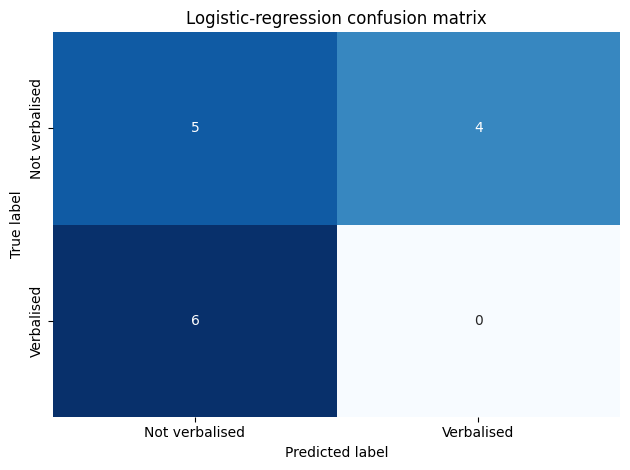

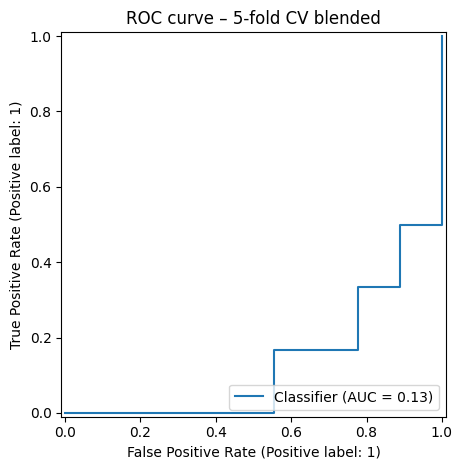

In [16]:
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (classification_report, confusion_matrix,
                             roc_auc_score, RocCurveDisplay)

clf = LogisticRegression(
    penalty="l2",
    C=1.0,
    max_iter=500,
    solver="liblinear",
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_pred = cross_val_predict(clf, X, y, cv=cv, method="predict")
y_proba = cross_val_predict(clf, X, y, cv=cv, method="predict_proba")[:, 1]

print(classification_report(y, y_pred, digits=3))
print(f"ROC-AUC: {roc_auc_score(y, y_proba):.3f}")

cm = confusion_matrix(y, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["Not verbalised", "Verbalised"],
            yticklabels=["Not verbalised", "Verbalised"])
plt.title("Logistic-regression confusion matrix")
plt.ylabel("True label"); plt.xlabel("Predicted label")
plt.tight_layout()
plt.show()

RocCurveDisplay.from_predictions(y, y_proba)
plt.title("ROC curve – 5-fold CV blended")
plt.tight_layout()
plt.show()


,feature,coef,abs_coef
79,backtracking,-0.580879,0.580879
27,BIGRAM::knowledge_augmentation→uncertainty_or_...,-0.446207,0.446207
74,BIGRAM::uncertainty_or_certainty_expression→other,0.409441,0.409441
26,BIGRAM::knowledge_augmentation→problem_restating,0.402856,0.402856
13,BIGRAM::forward_planning→option_restating,0.376728,0.376728
64,BIGRAM::problem_restating→other,-0.371797,0.371797
86,other,0.368353,0.368353
35,BIGRAM::logical_deduction→option_restating,-0.338921,0.338921
41,BIGRAM::option_elimination→logical_deduction,-0.331901,0.331901
83,logical_deduction,0.330914,0.330914


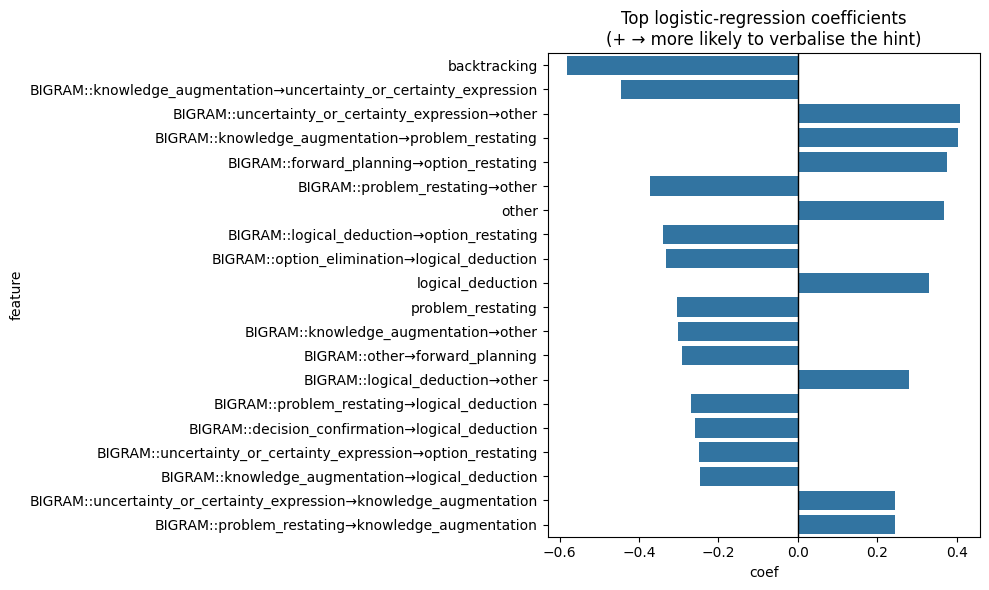

In [ ]:
clf_full = LogisticRegression(
    penalty="l2", C=1.0, max_iter=500, solver="liblinear")
clf_full.fit(X, y)

coefs = clf_full.coef_.ravel()
coef_df = (pd.DataFrame({
            "feature": feature_names,
            "coef":    coefs})
           .assign(abs_coef=lambda d: d.coef.abs())
           .sort_values("abs_coef", ascending=False)
           .head(20))          # top 20 by magnitude

display(coef_df)

plt.figure(figsize=(10,6))
sns.barplot(x="coef", y="feature", data=coef_df,
            orient="h")
plt.axvline(0, color="k", lw=1)
plt.title("Top logistic-regression coefficients\n(+ → more likely to verbalise the hint)")
plt.tight_layout()
plt.show()


In [19]:
from sklearn.model_selection import cross_val_score

# Train with only unigram counts
# Train with bigram-ONLY features
for subset, mask in {
    "unigrams":  np.vectorize(lambda n: not n.startswith("BIGRAM::"))(feature_names),
    "bigrams":   np.vectorize(lambda n:  n.startswith("BIGRAM::"))(feature_names),
}.items():
    
    X_sub = X[:, mask]
    clf_sub = LogisticRegression(C=1.0, max_iter=500, solver="liblinear")
    score   = cross_val_score(clf_sub, X_sub, y, cv=cv, scoring="roc_auc").mean()
    print(f"{subset:>8s}  |  ROC-AUC = {score:.3f}   |  n_features = {mask.sum()}")


unigrams  |  ROC-AUC = 0.200   |  n_features = 13
 bigrams  |  ROC-AUC = 0.200   |  n_features = 76
